In [1]:
import numpy as np
import pandas as pd

bureau_balance=pd.read_csv('./home_credit_data/bureau_balance_test.csv')
bureau=pd.read_csv('./home_credit_data/bureau_test.csv')
credit_card=pd.read_csv('./home_credit_data/credit_card.csv')
installment=pd.read_csv('./home_credit_data/installment.csv')
pos_cash=pd.read_csv('./home_credit_data/pos_cash.csv')
pre_app=pd.read_csv('./home_credit_data/pre_app.csv')
app_train=pd.read_csv('./home_credit_data/app_train.csv')

In [3]:
pre_app.head().T

,0,1,2,3,4
Unnamed: 0,6,58,68,82,133
SK_ID_PREV,2315218,1760006,2345724,2709276,2147401
SK_ID_CURR,175704,283527,197444,342991,202386
NAME_CONTRACT_TYPE,Cash loans,Cash loans,Cash loans,Revolving loans,Cash loans
AMT_ANNUITY,NaN,14730.7,10030.5,45000,NaN
AMT_APPLICATION,0,72000,360000,900000,0
AMT_CREDIT,0,72000,360000,900000,0
AMT_DOWN_PAYMENT,NaN,NaN,NaN,NaN,NaN
AMT_GOODS_PRICE,NaN,72000,360000,900000,NaN
WEEKDAY_APPR_PROCESS_START,TUESDAY,WEDNESDAY,THURSDAY,TUESDAY,WEDNESDAY


In [4]:
app_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Columns: 123 entries, Unnamed: 0 to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(42), object(16)
memory usage: 9.4+ MB


In [5]:
pd.set_option('display.max_rows', 200)
app_train.head().T

,0,1,2,3,4
Unnamed: 0,148432,125153,60085,51714,91980
SK_ID_CURR,272103,245137,169665,159887,206817
TARGET,1,1,1,1,1
NAME_CONTRACT_TYPE,Cash loans,Cash loans,Cash loans,Cash loans,Cash loans
CODE_GENDER,F,F,F,F,M
FLAG_OWN_CAR,N,N,N,N,N
FLAG_OWN_REALTY,N,Y,N,N,Y
CNT_CHILDREN,0,1,2,0,0
AMT_INCOME_TOTAL,180000,135000,112500,157500,202500
AMT_CREDIT,450000,521280,291384,1.08221e+06,545040


In [6]:
app_train_corr=app_train.corr()
app_train_corr

,Unnamed: 0,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
Unnamed: 0,1.000000,0.999999,-7.905610e-03,0.004461,0.006445,0.008967,0.010469,0.009309,0.011605,0.018568,...,-0.004554,-0.010092,-9.978436e-03,1.486843e-02,-0.008364,0.001768,-0.000367,-0.001054,0.000724,-0.005161
SK_ID_CURR,0.999999,1.000000,-7.897529e-03,0.004474,0.006448,0.008978,0.010476,0.009322,0.011596,0.018579,...,-0.004542,-0.010078,-9.965612e-03,1.484002e-02,-0.008363,0.001760,-0.000371,-0.001067,0.000705,-0.005181
TARGET,-0.007906,-0.007898,1.000000e+00,0.024809,-0.049460,-0.067649,-0.025840,-0.084407,-0.069843,0.142876,...,-0.026613,0.004473,-5.252055e-20,2.129126e-16,0.016473,-0.001197,-0.009371,-0.039190,-0.019773,0.035528
CNT_CHILDREN,0.004461,0.004474,2.480943e-02,1.000000,-0.007444,0.000823,0.026589,-0.004196,-0.032749,0.298570,...,-0.016903,-0.001242,-8.539698e-03,1.153489e-03,0.024340,0.007129,-0.012120,-0.013685,0.003334,-0.029827
AMT_INCOME_TOTAL,0.006445,0.006448,-4.945953e-02,-0.007444,1.000000,0.337213,0.442538,0.346232,0.137228,0.035523,...,0.011448,-0.001041,-1.073131e-04,1.275603e-02,0.021137,0.008276,0.004641,0.093500,0.030589,0.034521
AMT_CREDIT,0.008967,0.008978,-6.764902e-02,0.000823,0.337213,1.000000,0.765755,0.984968,0.119908,-0.082909,...,0.052415,-0.006347,2.249204e-02,-8.255105e-03,-0.005798,-0.001911,0.009636,0.053029,0.020997,-0.021683
AMT_ANNUITY,0.010469,0.010476,-2.583982e-02,0.026589,0.442538,0.765755,1.000000,0.769483,0.104935,-0.003188,...,-0.003222,-0.010896,1.730458e-02,-9.170258e-03,0.015728,-0.008412,0.020567,0.035426,0.023377,0.007098
AMT_GOODS_PRICE,0.009309,0.009322,-8.440736e-02,-0.004196,0.346232,0.984968,0.769483,1.000000,0.123318,-0.084009,...,0.047201,-0.007041,2.260458e-02,-6.396336e-03,-0.005724,-0.003677,0.009185,0.059281,0.023959,-0.027096
REGION_POPULATION_RELATIVE,0.011605,0.011596,-6.984309e-02,-0.032749,0.137228,0.119908,0.104935,0.123318,1.000000,-0.045329,...,0.014714,0.000695,-1.038454e-03,4.373654e-02,0.008927,-0.001353,0.004209,0.095176,-0.001360,0.006428
DAYS_BIRTH,0.018568,0.018579,1.428764e-01,0.298570,0.035523,-0.082909,-0.003188,-0.084009,-0.045329,1.000000,...,0.021688,0.000844,-1.768588e-02,1.285481e-02,0.031576,0.004465,-0.005555,0.000809,-0.018193,-0.067556


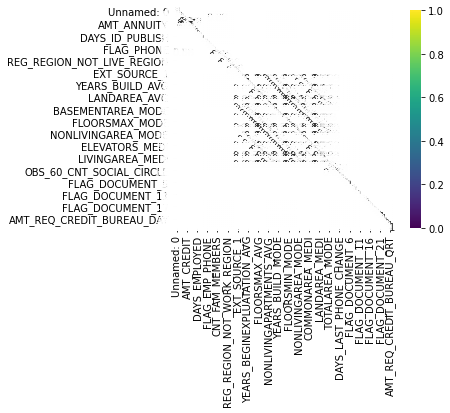

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(app_train_corr, square=True, annot=True, linewidths=.5, vmin=0, vmax=1, cmap='viridis')
plt.show()

In [10]:
def select_columns(data_frame, column_names):
    new_frame = data_frame.loc[:, column_names]
    return new_frame

In [15]:
selected_columns = ['TARGET','CNT_CHILDREN', 'DAYS_BIRTH', 'DAYS_REGISTRATION','DAYS_ID_PUBLISH','OWN_CAR_AGE','FLAG_EMP_PHONE','FLAG_WORK_PHONE','FLAG_CONT_MOBILE','CNT_FAM_MEMBERS','REGION_RATING_CLIENT','REGION_RATING_CLIENT_W_CITY','REG_REGION_NOT_LIVE_REGION','REG_REGION_NOT_WORK_REGION','REG_CITY_NOT_LIVE_CITY','REG_CITY_NOT_WORK_CITY','LIVE_CITY_NOT_WORK_CITY','NONLIVINGAPARTMENTS_AVG','NONLIVINGAPARTMENTS_MODE','NONLIVINGAPARTMENTS_MEDI','OBS_30_CNT_SOCIAL_CIRCLE','DEF_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE','DAYS_LAST_PHONE_CHANGE','FLAG_DOCUMENT_3','FLAG_DOCUMENT_5','FLAG_DOCUMENT_15','FLAG_DOCUMENT_19','FLAG_DOCUMENT_21','AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_YEAR']
train_model = select_columns(app_train, selected_columns)
train_model

,TARGET,CNT_CHILDREN,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,CNT_FAM_MEMBERS,...,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_3,FLAG_DOCUMENT_5,FLAG_DOCUMENT_15,FLAG_DOCUMENT_19,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_YEAR
0,1,0,-11224,-11200.0,-3444,NaN,1,1,1,2.0,...,0.0,0.0,-2321.0,1,0,0,0,0,0.0,2.0
1,1,1,-10166,-4537.0,-2802,NaN,1,0,1,3.0,...,2.0,1.0,-286.0,1,0,0,0,0,0.0,0.0
2,1,2,-18900,-9574.0,-2452,NaN,1,1,1,3.0,...,0.0,0.0,-400.0,1,0,0,0,0,0.0,0.0
3,1,0,-13981,-9253.0,-4543,NaN,1,0,1,1.0,...,9.0,0.0,-7.0,1,0,0,0,0,0.0,0.0
4,1,0,-18307,-2482.0,-1859,NaN,1,0,1,2.0,...,0.0,0.0,-1474.0,0,0,0,0,0,0.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0,0,-13125,-218.0,-4978,NaN,1,0,1,2.0,...,0.0,0.0,-2027.0,1,0,0,0,0,0.0,2.0
9996,0,0,-14615,-2296.0,-1950,NaN,1,0,1,1.0,...,0.0,0.0,-1222.0,1,0,0,0,0,0.0,0.0
9997,0,0,-22785,-9517.0,-4731,NaN,0,0,1,1.0,...,0.0,0.0,-764.0,1,0,0,0,0,0.0,3.0
9998,0,2,-10559,-367.0,-2586,NaN,1,0,1,4.0,...,7.0,0.0,-2645.0,1,0,0,0,0,0.0,1.0


## Pandas Profiling Report

In [23]:
from pandas_profiling import ProfileReport
profile = ProfileReport(train_model, title="Pandas Profiling Report")

In [24]:
profile